In [1]:
# Install Open CV
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
#Importing the required libraries

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

In [3]:
# Converting video types
input_file = 'D:/RVIM Capstone Project/On Road Dataset/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', 'D:/RVIM Capstone Project/On Road Dataset/bdd100k_videos_train_00/bdd100k/videos/train/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=1)

In [4]:
# To locate the converted video
%ls -GFlash --color

 Volume in drive C is OS
 Volume Serial Number is 300B-CBB7

 Directory of C:\Users\ASUS


 Directory of C:\Users\ASUS



File Not Found


In [5]:
# To display the video
ipd.Video('026c7465-309f6d33.mp4', width=700)

In [6]:
# Load the video for capture
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [7]:
# Get the number of frames in the video
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [8]:
# Get the height and width of the video
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [9]:
# Get frame rate
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [10]:
# Release the file from the code
cap.release()

In [11]:
# Capture the image from the video
# Get the image shape
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [12]:
img

array([[[ 54,  67,  61],
        [ 54,  67,  61],
        [ 54,  67,  61],
        ...,
        [ 19,  12,   9],
        [ 19,  12,   9],
        [ 19,  12,   9]],

       [[ 54,  67,  61],
        [ 54,  67,  61],
        [ 54,  67,  61],
        ...,
        [ 19,  12,   9],
        [ 19,  12,   9],
        [ 19,  12,   9]],

       [[ 51,  64,  58],
        [ 51,  64,  58],
        [ 51,  64,  58],
        ...,
        [ 19,  12,   9],
        [ 19,  12,   9],
        [ 19,  12,   9]],

       ...,

       [[122, 122, 122],
        [121, 121, 121],
        [119, 119, 119],
        ...,
        [ 38,  33,  34],
        [ 37,  32,  33],
        [ 37,  32,  33]],

       [[123, 123, 123],
        [119, 119, 119],
        [114, 114, 114],
        ...,
        [ 40,  35,  36],
        [ 40,  35,  36],
        [ 38,  33,  34]],

       [[111, 111, 111],
        [107, 107, 107],
        [ 98,  98,  98],
        ...,
        [ 40,  35,  36],
        [ 40,  35,  36],
        [ 40,  35,  36]]

In [13]:
# Helper function for plotting opencv images in notebook
def display_cv2_img(img, figsize=(10, 10)):      # Takes image in cv2 format
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Converts from BGR to RGB colour format
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

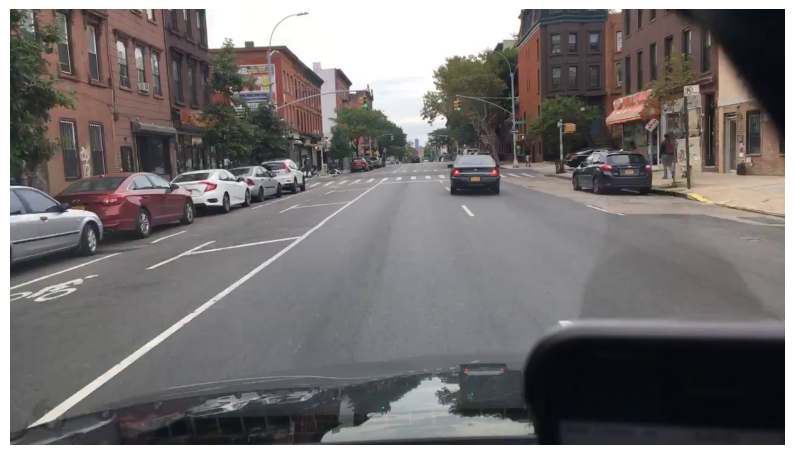

In [14]:
# Display the image
display_cv2_img(img)

In [15]:
cap.release()

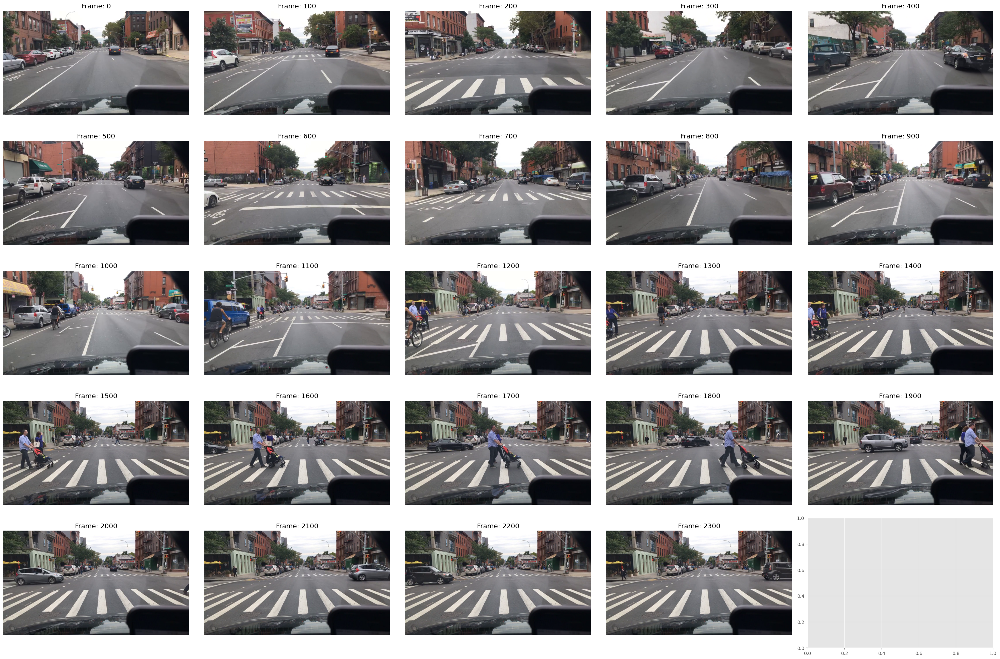

In [16]:
# Display multiple frames from the video
# Grid sub plots for frames/images
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

# Get the frame count
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()       # Get the images from the frames
    if ret == False:
        break
    if frame % 100 == 0:        # Get every 100th frame as image
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # Converting BGR to RGB
        axs[img_idx].set_title(f'Frame: {frame}')  # Set box title to frame number
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

In [17]:
# Add annotations to the images
# Load the labels for the images
labels = pd.read_csv('D:/RVIM Capstone Project/On Road Dataset/mot_labels.csv',
                     low_memory=False)
labels.head()

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True


In [18]:
labels

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo
0,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89537.0,car,False,True,False,825.173210,1003.094688,355.011547,418.198614,True
1,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89538.0,car,False,True,False,484.295612,700.461894,346.697460,424.849885,True
2,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89539.0,pedestrian,False,True,False,645.588915,663.879908,338.383372,358.337182,True
3,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89540.0,car,False,False,False,120.969977,192.471132,359.168591,409.053118,True
4,01c71072-718028b8-0000001.jpg,01c71072-718028b8,0,89541.0,car,False,False,False,251.501155,315.519630,354.180139,400.739030,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2890841,00adbb3f-7757d4ea-0000202.jpg,00adbb3f-7757d4ea,201,70587.0,car,False,True,False,105.312994,169.282443,451.341401,500.152672,True
2890842,00adbb3f-7757d4ea-0000202.jpg,00adbb3f-7757d4ea,201,70591.0,car,False,True,False,312.328249,368.244275,460.368229,490.457656,True
2890843,00adbb3f-7757d4ea-0000202.jpg,00adbb3f-7757d4ea,201,70593.0,car,False,True,False,368.533042,414.700981,467.384253,491.059444,True
2890844,00adbb3f-7757d4ea-0000202.jpg,00adbb3f-7757d4ea,201,70581.0,car,False,True,False,0.524781,111.778426,446.064140,500.641399,True


In [19]:
# Filter the labels to only the associated video by running a query
# Note: Video and the labels are not in the same framerate
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int") # Adjusting the frame rate according to the labling of frames

In [20]:
video_labels

,name,videoName,frameIndex,id,category,attributes.crowd,attributes.occluded,attributes.truncated,box2d.x1,box2d.x2,box2d.y1,box2d.y2,haveVideo,video_frame
0,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107627.0,car,False,False,True,0.000000,153.988439,291.329480,423.319571,True,0
1,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107628.0,car,False,True,False,68.373245,306.193229,269.925681,380.511974,True,0
2,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107629.0,car,False,True,False,264.574732,398.943022,262.791082,337.704377,True,0
3,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107630.0,car,False,True,False,359.036452,450.074319,258.390115,317.489678,True,0
4,026c7465-309f6d33-0000001.jpg,026c7465-309f6d33,0,107631.0,car,False,True,False,411.295127,488.715386,246.777076,305.598679,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5166,026c7465-309f6d33-0000202.jpg,026c7465-309f6d33,201,107719.0,car,False,True,False,613.232969,631.297696,246.777076,260.648206,True,2392
5167,026c7465-309f6d33-0000202.jpg,026c7465-309f6d33,201,107646.0,car,True,True,False,619.309909,670.255711,233.713868,261.097237,True,2392
5168,026c7465-309f6d33-0000202.jpg,026c7465-309f6d33,201,107726.0,bus,False,True,False,709.738708,738.395722,234.987513,249.634431,True,2392
5169,026c7465-309f6d33-0000202.jpg,026c7465-309f6d33,201,107714.0,bicycle,False,False,False,878.977001,892.857026,246.356507,273.515276,True,2392


In [21]:
# Get the categories/objects in the label
video_labels["category"].value_counts()

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [22]:
# Get and display frame 1035
# Similar code as capture object done above
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

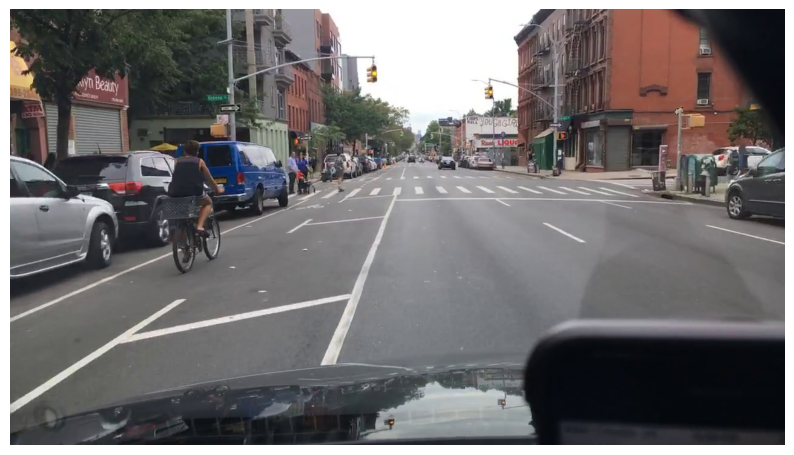

In [23]:
# Display the extracted image
display_cv2_img(img)

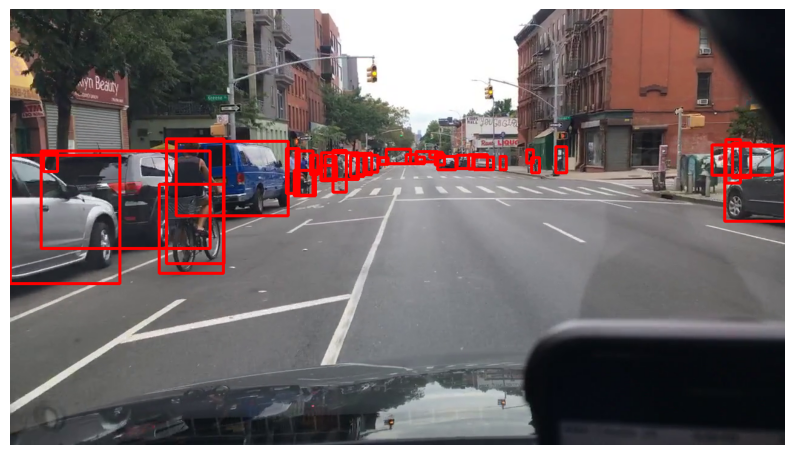

In [24]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035') # Fetch labels for the particular frame
for i, d in frame_labels.iterrows():                     # Iterate over the label rows
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])         # Point one of the frame of the object
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])         # Point two of the frame of the object
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3) # Making frames to enclose the objects

display_cv2_img(img_example)

In [25]:
d # Values and information of the object in the image

name                    026c7465-309f6d33-0000088.jpg
videoName                           026c7465-309f6d33
frameIndex                                         87
id                                           107707.0
category                                   pedestrian
attributes.crowd                                False
attributes.occluded                              True
attributes.truncated                            False
box2d.x1                                    55.691207
box2d.x2                                    78.278414
box2d.y1                                   236.627887
box2d.y2                                    268.41729
haveVideo                                        True
video_frame                                      1035
Name: 2110, dtype: object

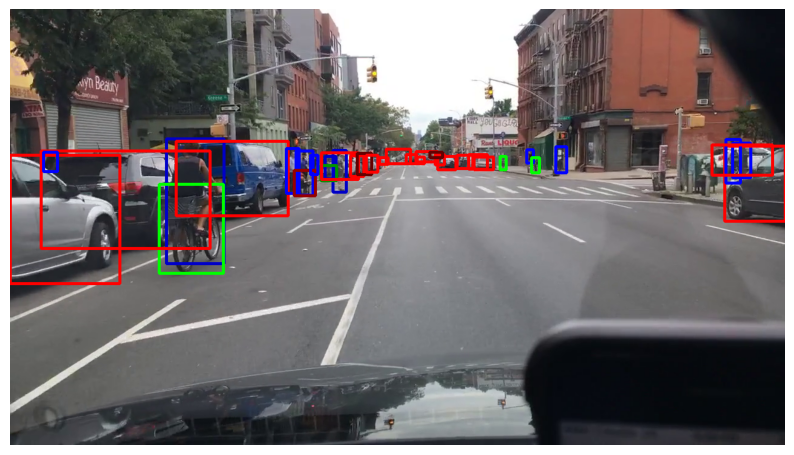

In [26]:
# Enclosing objects with different coloured rectangle
# Setting the colour map for the objects (BGR setting)
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]                        # Adding the assigned colour to the rectangle from the previous code
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

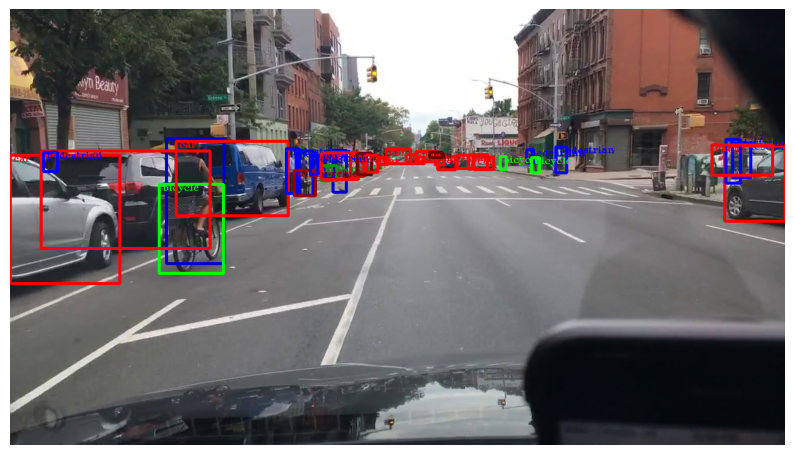

In [27]:
# Adding text for the objects
frame_labels = video_labels.query("video_frame == @frame")
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)                           # Code for text
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)    # Code for text
display_cv2_img(img_example)
cap.release()

In [28]:
# Give out the labelled and processed video

# Put the previous code in a function so that all the images can be labeled by iteration
def add_annotations(img, frame, video_labels):
    max_frame = video_labels.query("video_frame <= @frame")["video_frame"].max()
    frame_labels = video_labels.query("video_frame == @max_frame")
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [ ]:
# !rm -r out_test.mp4

In [ ]:
# Remove the test file if present
# import os

# file_path = 'out_test.mp4'
# if os.path.exists(file_path):
#     os.remove(file_path)
#     print(f'{file_path} has been removed.')
# else:
#     print(f'{file_path} does not exist.')

In [29]:
# Creation of the video from the images step 1
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                fps,
                (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    img = add_annotations(img, frame, video_labels)
    out.write(img)
out.release()
cap.release()

100%|██████████████████████████████████████████████████████████████████████████████| 2398/2398 [00:56<00:00, 42.71it/s]


In [30]:
%ls -GFlash -color

 Volume in drive C is OS
 Volume Serial Number is 300B-CBB7

 Directory of C:\Users\ASUS


 Directory of C:\Users\ASUS



File Not Found


In [31]:
# Turn the video into compressed mp4
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=1)

In [32]:
%ls -GFlash --color

 Volume in drive C is OS
 Volume Serial Number is 300B-CBB7

 Directory of C:\Users\ASUS


 Directory of C:\Users\ASUS



File Not Found


In [33]:
# Display the compiled/rendered video
ipd.Video('out_test_compressed.mp4', width=700)